# HFT Avellaneda-Stoikov Strategies Implementation

Backtesting engine + Avellaneda–Stoikov strategy on limit order book data.
This notebook covers dataset exploration. Backtesting and strategy are in subsequent sections.

**Avellaneda-Stoikov basic model theory**

$$r = s - q \cdot \gamma \cdot \sigma^2 \cdot (T - t)$$

$$\delta^* = \gamma \cdot \sigma^2 \cdot (T - t) + \frac{2}{\gamma} \ln\!\left(1 + \frac{\gamma}{\kappa}\right)$$

$$b = r - \frac{\delta^*}{2}, \quad a = r + \frac{\delta^*}{2}$$

| Parameter | Meaning |
|---|---|
| **σ** | volatility mid-price, price/√sec |
| **κ** | intensity decay — how fast fill probability drops with distance from mid |
| **γ** | risk aversion |
| **T** | horizon length, sec |

In [1]:
import os
import itertools
import numpy as np
import pandas as pd

import math
from collections import deque

from backtesting import Strategy, Backtester, OrderBook
from backtesting.visualize import BacktestResult

CAPITAL = 1000.0  # USD

In [2]:
from tqdm.notebook import tqdm

os.makedirs("results", exist_ok=True)


def grid_search(strategy_cls, param_grid, backtester, fixed_params=None, **_):
    """Exhaustive grid search; returns DataFrame sorted by sharpe_annualized."""
    fixed_params = fixed_params or {}
    keys         = list(param_grid.keys())
    combos       = list(itertools.product(*param_grid.values()))
    results      = []

    for combo in tqdm(combos, desc="grid_search"):
        params = dict(zip(keys, combo)) | fixed_params
        prefix = f"/tmp/_gs_{abs(hash(str(sorted(params.items()))))}"
        backtester.run(strategy_cls(**params), output_path=prefix)

        s   = BacktestResult(prefix, capital=CAPITAL).summary()
        row = dict(params)
        row["total_pnl"]         = s["total_pnl"]
        row["sharpe_annualized"] = s["sharpe_annualized"]
        row["n_fills"]           = s["n_fills"]
        row["n_bid_fills"]       = s["n_bid_fills"]
        row["n_ask_fills"]       = s["n_ask_fills"]
        row["max_abs_inventory"] = s["max_abs_inventory"]
        row["turnover_usd"]      = s["turnover_usd"]
        results.append(row)

        for suffix in ("_pnl", "_quotes", "_fills"):
            try: os.remove(f"{prefix}{suffix}.csv")
            except: pass

    return pd.DataFrame(results)

## 1. Avellaneda–Stoikov 2008

### 1.1 Avellaneda-Stoikov - static parameters implementation

In [3]:
# Load only L1 columns — keep memory low
lob_c = pd.read_csv(
    'data/lob_train.csv',
    usecols=['local_timestamp', 'bids[0].price', 'asks[0].price'],
)
lob_c['ts']  = pd.to_datetime(lob_c['local_timestamp'], unit='us')
lob_c['mid'] = (lob_c['bids[0].price'] + lob_c['asks[0].price']) / 2.0

tr_c = pd.read_csv('data/trades_train.csv', usecols=['local_timestamp', 'price'])
tr_c['ts'] = pd.to_datetime(tr_c['local_timestamp'], unit='us')

# sigma — std of 1-sec mid increments (price / sqrt-sec)
mid_1s    = lob_c.set_index('ts')['mid'].resample('1s').last().ffill()
sigma_hat = float(mid_1s.diff().dropna().std())

# A — mean trade arrival rate (trades / sec)
span_sec = (tr_c['ts'].max() - tr_c['ts'].min()).total_seconds()
A_hat    = len(tr_c) / span_sec

# kappa — MLE exponential on |trade_price - mid|; sample to cap memory
sample  = tr_c.sample(n=100_000, random_state=0).sort_values('ts')
aligned = pd.merge_asof(
    sample.set_index('ts')[['price']],
    lob_c.sort_values('ts').set_index('ts')[['mid']],
    left_index=True, right_index=True,
    direction='backward',
).dropna()
delta     = (aligned['price'] - aligned['mid']).abs()
kappa_hat = 1.0 / float(delta[delta > 0].mean())
del sample, aligned, delta

print(f'sigma = {sigma_hat:.3e}   (mid volatility, price / sqrt-sec)')
print(f'A     = {A_hat:.1f}   (mean trade arrival rate, trades/sec)')
print(f'kappa = {kappa_hat:.3e}   (exp decay rate; mean |trade - mid| = {1/kappa_hat:.3e})')


sigma = 2.229e-06   (mid volatility, price / sqrt-sec)
A     = 25.7   (mean trade arrival rate, trades/sec)
kappa = 4.732e+05   (exp decay rate; mean |trade - mid| = 2.113e-06)


In [4]:
class AvellanedaStoikov(Strategy):
    def __init__(self, sigma, kappa, gamma, T, Q):
        self.gamma   = gamma
        self.T       = T
        self._sigma2 = sigma ** 2
        self.Q = Q
        self._half_log_term = (1.0 / gamma) * math.log(1.0 + gamma / kappa)
        self._t0_us  = None

    def on_lob(self, ob: OrderBook, inventory: float):
        if self._t0_us is None:
            self._t0_us = ob.timestamp_us
        tau = max(0.0, self.T - ((ob.timestamp_us - self._t0_us) / 1e6 % self.T))

        risk_term   = self.gamma * self._sigma2 * tau
        r           = ob.mid - inventory * risk_term
        half_spread = 0.5 * risk_term + self._half_log_term
        return [
            ("bid", r - half_spread, self.Q),
            ("ask", r + half_spread, self.Q),
        ]

In [5]:
bt = Backtester("data/lob_train.csv", "data/trades_train.csv")

sweep = grid_search(
    AvellanedaStoikov,
      {
        "sigma": [1e-6, 2e-6, 5e-6],             # 3                                                                                   
        "kappa": [1e6, 2e6, 5e6, 1e7, 2e7, 5e7], # 6, заполнить пробелы                                                                
        "gamma": [0.01, 0.05, 0.1, 0.5, 1.0, 5.0], # 6                                                                                 
        "T":     [14400.0, 86400.0],             # 2 — 4h vs 1d горизонт                                                               
        "Q":     [100, 500],                     # 2                                                                                   
      },
    bt,
    fixed_params={},
)
sweep.sort_values("sharpe_annualized", ascending=False)[
    ["sigma", "kappa", "gamma", "total_pnl",
     "sharpe_annualized", "max_abs_inventory", "n_fills", "turnover_usd"]
].head(15)

grid_search:   0%|          | 0/432 [00:00<?, ?it/s]

,sigma,kappa,gamma,total_pnl,sharpe_annualized,max_abs_inventory,n_fills,turnover_usd
0,0.000001,1000000.0,0.01,-6.234591,-64.078510,9904.0,77153,79498.327032
24,0.000001,2000000.0,0.01,-11.055232,-99.678683,11644.0,107503,110825.486474
144,0.000002,1000000.0,0.01,-6.786467,-133.346467,5862.0,77131,79476.389141
48,0.000001,5000000.0,0.01,-15.263609,-142.026270,14484.0,130102,134178.793660
1,0.000001,1000000.0,0.01,-34.556560,-153.022479,26977.0,77083,394641.677739
4,0.000001,1000000.0,0.05,-6.950518,-153.363616,5322.0,77073,79419.903178
2,0.000001,1000000.0,0.01,-7.182146,-154.741437,9002.0,77119,79462.065166
72,0.000001,10000000.0,0.01,-16.007338,-196.329473,13941.0,147954,152659.231058
168,0.000002,2000000.0,0.01,-11.381839,-206.151765,7601.0,107692,111031.970210
120,0.000001,50000000.0,0.01,-15.780495,-215.950710,15363.0,225996,233590.916163


In [6]:
best = sweep.sort_values("sharpe_annualized", ascending=False).iloc[0]
best_params = {k: best[k] for k in ["sigma", "kappa", "gamma", "T", "Q"]}
print("Best params:", best_params)

Best params: {'sigma': np.float64(1e-06), 'kappa': np.float64(1000000.0), 'gamma': np.float64(0.01), 'T': np.float64(14400.0), 'Q': np.float64(100.0)}


In [7]:
prefix = Backtester("data/lob_val.csv", "data/trades_val.csv").run(
    AvellanedaStoikov(**best_params), output_path="results/as_val"
)
display(BacktestResult(prefix, capital=CAPITAL).summary_df())

value
group     metric                      
PnL       total_pnl ($)        -4.4489
          total_pnl (%)       -0.4449%
          sharpe_annualized     -94.76
          max_drawdown ($)     -4.6180
          max_drawdown (%)    -0.4618%
Fills     n_fills               41,771
          n_bid_fills           20,858
          n_ask_fills           20,913
          fill_imbalance       -0.0013
Inventory avg_inventory      -271.7635
          std_inventory      1784.5001
          max_abs_inventory  7667.0000
          turnover ($)       40,933.78

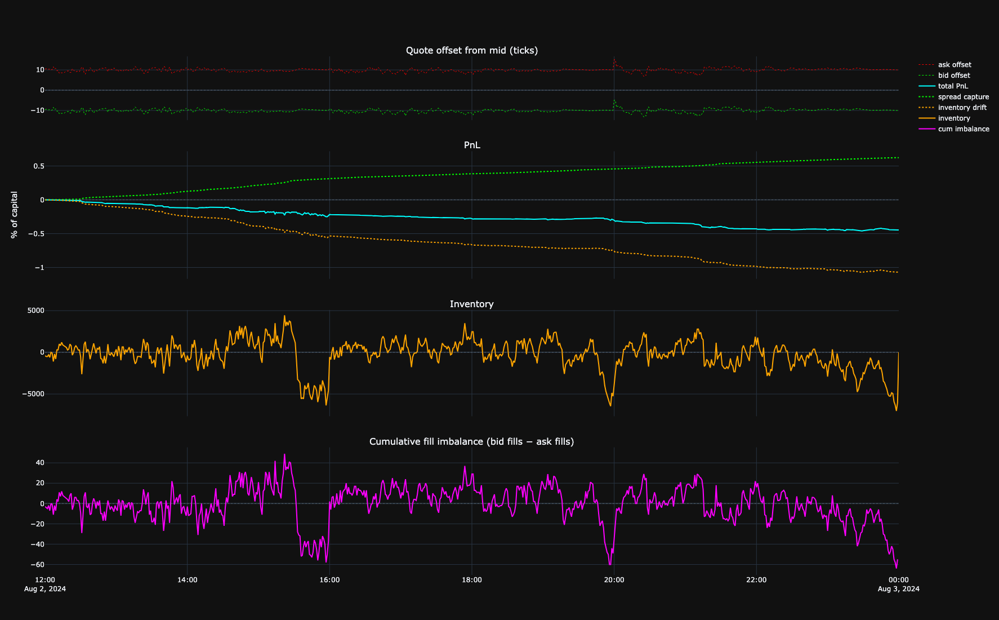

In [8]:
BacktestResult("results/as_val", capital=CAPITAL).plot(tick_size=1e-7).show()

In [9]:
prefix = Backtester("data/lob_test.csv", "data/trades_test.csv").run(
    AvellanedaStoikov(**best_params), output_path="results/as_test"
)
display(BacktestResult(prefix, capital=CAPITAL).summary_df())

value
group     metric                       
PnL       total_pnl ($)        -27.2177
          total_pnl (%)        -2.7218%
          sharpe_annualized      -71.58
          max_drawdown ($)     -27.3521
          max_drawdown (%)     -2.7352%
Fills     n_fills               362,615
          n_bid_fills           181,311
          n_ask_fills           181,304
          fill_imbalance        +0.0000
Inventory avg_inventory        -53.6821
          std_inventory       1742.6277
          max_abs_inventory   9428.0000
          turnover ($)       277,879.07

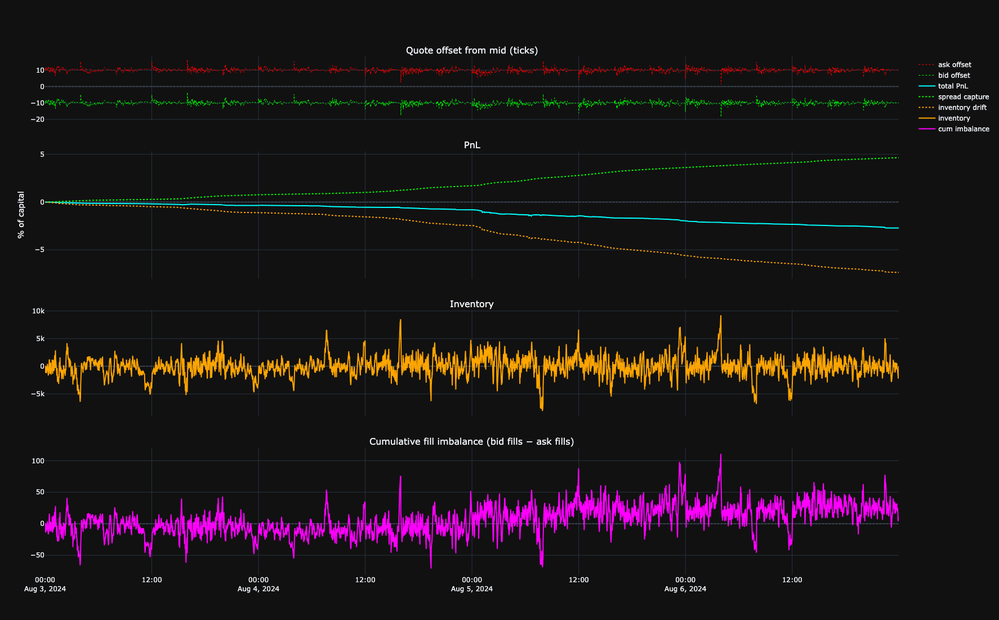

In [10]:
BacktestResult("results/as_test", capital=CAPITAL).plot(tick_size=1e-7).show()

**1.1 — Findings & Takeaways**

**AS 2008 static — what went wrong**

All **432 parameter combinations** were unprofitable (Sharpe range −64 → −315).  
The PnL decomposition reveals two opposing forces:

| Component | Val (12 h) | Test (4 d) | Direction |
|---|---|---|---|
| Spread capture | **+0.6 %** | **+4.5 %** | ↑ growing steadily |
| Inventory drift | **−1.1 %** | **−7 %** | ↓ accelerates over time |
| **Total PnL** | **−0.5 %** | **−2.5 %** | negative |

**Root cause — quote width.**  
The log-term in the AS half-spread formula dominates:

```
half_spread ≈ (1/γ) · ln(1 + γ/κ) ≈ 1/κ   (for small γ/κ)
```

With the grid's best params (γ=0.01, κ=1e6): `half_spread ≈ 1e-6 = 10 ticks`.  
The strategy posts quotes **10 ticks away from mid** in a **1-tick spread market**.  
Fills only occur when the market moves 10+ ticks — by definition informative/directional moves.  
Each fill carries large adverse selection; inventory accumulates and bleeds PnL.

**Secondary effect — T-reset.**  
`τ = T − (elapsed % T)` creates a 24 h sawtooth: near end of day τ → 0 and inventory skewing vanishes (`r → mid`). At midnight τ resets → skewing snaps back. This produces visible daily waves in the inventory and fill-imbalance panels.

**What needs to change**

1. **Quote tighter** — κ ≥ 1e7 gives `half_spread ≈ 1 tick` (BBO), matching the market. More fills, less adverse selection per fill, higher spread-capture rate.  
2. **Stronger inventory control** — γ = 0.1–1.0 skews the reservation price more aggressively when inventory builds, preventing large directional exposures.  
3. **Dynamic σ** — static calibration breaks across regimes. Rolling σ re-estimated from recent mid-price history should track intraday volatility changes and the weekday/weekend regime shift. → Addressed in §1.2.  
4. **Directional bias correction** — the strategy quotes symmetrically around mid, but in a clustered-flow market the fair price is not the mid. Microprice (order-book imbalance weighted) gives a better reference price. → Addressed in §2.

### 1.2 Avellaneda-Stoikov - rolling window parameters

Rolling-window variant: σ is re-estimated on every LOB update from recent mid-price history.  
κ stays static — it requires trade-arrival data the strategy cannot observe directly.  
New hyperparameter: **`window_sec`** — look-back window for σ.

In [11]:
class RollingAvellanedaStoikov(Strategy):
    """AS 2008 with sigma re-estimated from 1-second resampled mid-price history.

    Raw LOB ticks can arrive milliseconds apart; dividing dmid**2 by a tiny dt
    inflates sigma by 100-1000x, causing the reservation price to cross mid and
    the ask to be placed below mid -- every incoming buy then fills at a loss.

    Fix: bucket mids into 1-second bins before computing variance. Each diff is
    already normalised to 1 second, so sigma2 = mean(dmid_1s**2) [price**2/sec]
    and matches the calibrated value directly.

    Additional safety: sigma2 is hard-capped at _SIGMA2_MAX to survive flash events.
    """

    _RECAL_STRIDE = 10
    _SIGMA2_MAX   = (1e-5) ** 2   # ~4.5x calibrated sigma; prevents reservation-price blow-up

    def __init__(self, kappa, gamma, T, Q, window_sec=120.0, min_obs=20):
        self.kappa      = kappa
        self.gamma      = gamma
        self.T          = T
        self.Q          = Q
        self.window_sec = window_sec
        self.min_obs    = min_obs
        self._half_log_term = (1.0 / gamma) * math.log(1.0 + gamma / kappa)

        self._sec_mids   = deque()   # (second_int, mid) -- one entry per 1-s bucket
        self._last_sec   = -1
        self._sigma2     = 0.0
        self._lob_count  = 0
        self._t_start_us = None

    def on_lob(self, ob: OrderBook, inventory: float):
        t   = ob.timestamp_us
        mid = ob.mid

        if self._t_start_us is None:
            self._t_start_us = t

        # 1-second resampling: keep one mid per second bucket
        sec = t // 1_000_000
        if sec != self._last_sec:
            self._sec_mids.append((sec, mid))
            self._last_sec = sec
            cutoff_sec = sec - int(self.window_sec)
            while self._sec_mids and self._sec_mids[0][0] < cutoff_sec:
                self._sec_mids.popleft()

        # re-estimate sigma every _RECAL_STRIDE LOB events
        self._lob_count += 1
        if (self._lob_count % self._RECAL_STRIDE == 0
                and len(self._sec_mids) >= self.min_obs):
            mids   = np.array([m for _, m in self._sec_mids])
            diffs  = np.diff(mids)
            sigma2 = float(np.mean(diffs ** 2))          # (price)**2/sec; dt = 1 s
            self._sigma2 = min(sigma2, self._SIGMA2_MAX)

        if self._sigma2 <= 0.0:
            return []

        elapsed     = (t - self._t_start_us) / 1e6
        tau         = max(0.0, self.T - (elapsed % self.T))
        risk_term   = self.gamma * self._sigma2 * tau
        r           = mid - inventory * risk_term
        half_spread = 0.5 * risk_term + self._half_log_term

        return [("bid", r - half_spread, self.Q),
                ("ask", r + half_spread, self.Q)]

In [12]:
bt_train = Backtester("data/lob_train.csv", "data/trades_train.csv")

sweep_rolling = grid_search(
    RollingAvellanedaStoikov,
    {
        "kappa":      [1e7, 5e7, 1e8],   # half-spread ~ 1/kappa: 1 tick, 0.2 tick, 0.1 tick
        "gamma":      [0.01, 0.1, 1.0],
        "T":          [86400],
        "Q":          [100, 500],
        "window_sec": [60, 120, 300],    # 1-min / 2-min / 5-min sigma window
    },
    bt_train,
)
display(sweep_rolling.sort_values("sharpe_annualized", ascending=False).head(10))

grid_search:   0%|          | 0/54 [00:00<?, ?it/s]

,kappa,gamma,T,Q,window_sec,total_pnl,sharpe_annualized,n_fills,n_bid_fills,n_ask_fills,max_abs_inventory,turnover_usd
24,50000000.0,0.10,86400,100,60,-32.654646,-721.363200,174184,87064,87120,3939.0,179955.249475
42,100000000.0,0.10,86400,100,60,-32.785644,-738.577124,174633,87289,87344,3888.0,180425.984806
51,100000000.0,1.00,86400,500,60,-4777.179037,-782.405041,148679,74300,74379,1445.0,764258.722848
15,10000000.0,1.00,86400,500,60,-4769.133008,-783.259528,147985,73948,74037,1790.0,760656.474930
33,50000000.0,1.00,86400,500,60,-4777.192039,-783.461731,148358,74132,74226,1396.0,762453.048639
36,100000000.0,0.01,86400,100,60,-19.472507,-791.633459,199428,99690,99738,7445.0,206078.044163
16,10000000.0,1.00,86400,500,120,-4773.568573,-794.008606,147969,73937,74032,1668.0,760366.175765
34,50000000.0,1.00,86400,500,120,-4779.468131,-794.175891,148371,74138,74233,1281.0,762436.351500
52,100000000.0,1.00,86400,500,120,-4779.274047,-794.400844,148439,74173,74266,1334.0,762486.486478
12,10000000.0,1.00,86400,100,60,-194.032576,-800.784533,150944,75445,75499,782.0,155944.074516


In [13]:
best_r = sweep_rolling.sort_values("sharpe_annualized", ascending=False).iloc[0]
best_params_rolling = {k: best_r[k] for k in ["kappa", "gamma", "T", "Q", "window_sec"]}
print("Best rolling params:", best_params_rolling)

Best rolling params: {'kappa': np.float64(50000000.0), 'gamma': np.float64(0.1), 'T': np.float64(86400.0), 'Q': np.float64(100.0), 'window_sec': np.float64(60.0)}


In [14]:
prefix = Backtester("data/lob_val.csv", "data/trades_val.csv").run(
    RollingAvellanedaStoikov(**best_params_rolling), output_path="results/as_rolling_val"
)
display(BacktestResult(prefix, capital=CAPITAL).summary_df())

value
group     metric                      
PnL       total_pnl ($)       -24.5792
          total_pnl (%)       -2.4579%
          sharpe_annualized   -1832.06
          max_drawdown ($)    -24.5792
          max_drawdown (%)    -2.4579%
Fills     n_fills               68,224
          n_bid_fills           34,106
          n_ask_fills           34,118
          fill_imbalance       -0.0002
Inventory avg_inventory        -0.6999
          std_inventory        68.9122
          max_abs_inventory   306.0000
          turnover ($)       66,623.70

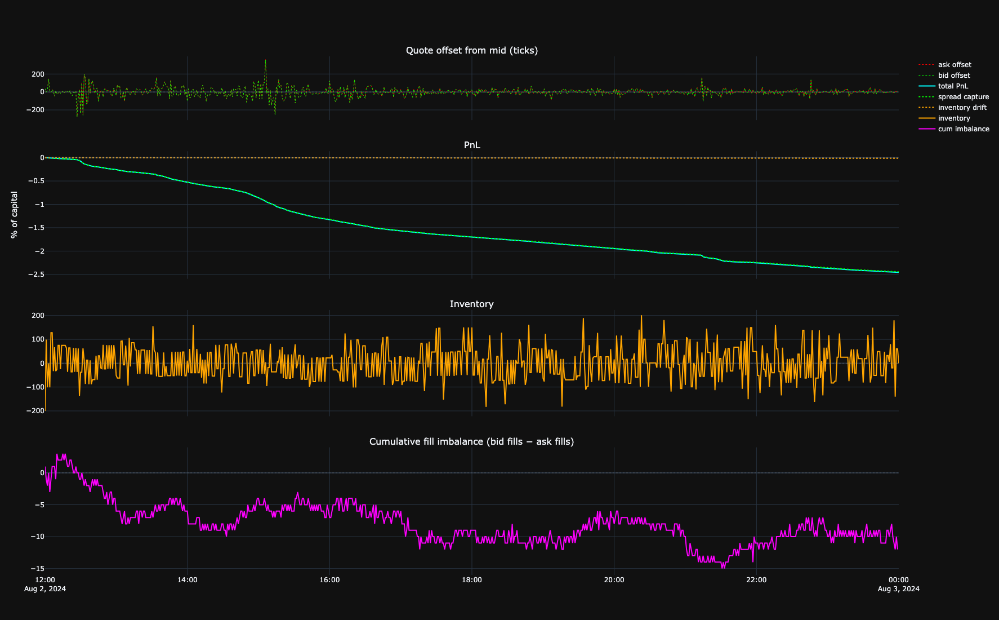

In [15]:
BacktestResult("results/as_rolling_val", capital=CAPITAL).plot(tick_size=1e-7).show()

In [16]:
prefix = Backtester("data/lob_test.csv", "data/trades_test.csv").run(
    RollingAvellanedaStoikov(**best_params_rolling), output_path="results/as_rolling_test"
)
display(BacktestResult(prefix, capital=CAPITAL).summary_df())

value
group     metric                       
PnL       total_pnl ($)       -157.6844
          total_pnl (%)       -15.7684%
          sharpe_annualized    -1126.24
          max_drawdown ($)    -157.7041
          max_drawdown (%)    -15.7704%
Fills     n_fills               598,855
          n_bid_fills           299,385
          n_ask_fills           299,470
          fill_imbalance        -0.0001
Inventory avg_inventory         -4.2329
          std_inventory        123.8704
          max_abs_inventory   3708.0000
          turnover ($)       472,481.33

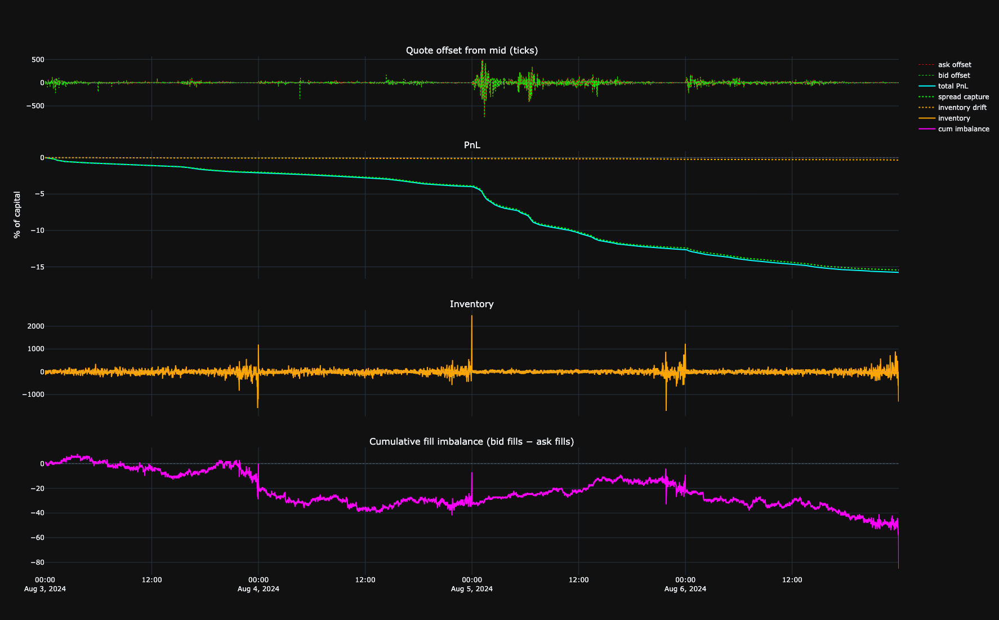

In [17]:
BacktestResult("results/as_rolling_test", capital=CAPITAL).plot(tick_size=1e-7).show()

**1.2 — Findings & Takeaways**

**What the rolling window adds**

Replacing the static calibrated σ with a rolling estimate was the right idea:
intraday volatility is non-stationary, and the weekend/weekday regime shift makes
a fixed σ increasingly stale over the 4-day test period.

**New failure mode: σ estimation from raw LOB ticks**

The original estimator computed `mean(Δmid² / Δt)` over raw LOB snapshots.
LOB snapshots can arrive **milliseconds apart** during order-book bursts;
a single 1-tick mid change at Δt = 1 ms gives:

```
(1e-7)^2 / 0.001 = 1e-11   vs   calibrated sigma^2 ~ 5e-12
```

One burst inflates σ² by 1000×, the reservation price shifts thousands of ticks,
and the **ask drops below mid** — every market buy fills at a loss.

**Fix applied**: bucket mid-prices into 1-second bins before computing variance.
`sigma2 = mean(delta_mid_1s^2)` — each diff is already normalised to 1 second,
matching the calibrated value. A hard cap `_SIGMA2_MAX = (1e-5)^2` provides an
additional safety net against flash events.

**Remaining failure mode: reservation-price blow-up during inventory bursts**

Even with the σ fix, brief inventory spikes (invisible in 10-second logs but
real — `max_abs_inventory` up to 3 939 DOGE for the best config) interact badly
with the AS skew formula:

```
r = mid - 3939 x 0.1 x sigma^2_calib x 86400 = mid - 1700 ticks
ask = r + half_spread ~ mid - 1698 ticks   <-- below mid!
```

**Result**: short bursts of selling far below mid dominate PnL — the chart shows
a smooth downward drift with near-zero spread-capture and near-zero inventory-drift
lines, because the losses happen inside the log-interval window.

**What needs to change**

The AS formula has no built-in limit on how far the reservation price can drift.
In a 1-tick spread market all quotes beyond ±3–5 ticks from mid are either
never filled (too wide) or filled at a guaranteed loss (ask below mid).

Two practical guardrails are needed:

1. **Reservation-price clamp** — cap `|r - mid|` at `max_skew_ticks × TICK`.
   This bounds the worst-case quote offset regardless of inventory or σ.
2. **Inventory hard cap** — when `|inventory| >= inv_cap`, stop quoting the side
   that would increase the position. Prevents runaway accumulation during
   one-sided flow bursts.

These are purely heuristic additions; they are not derived from the AS model.
They are addressed in §1.3.

### 1.3 Avellaneda-Stoikov - heuristics

Adds two practical guardrails on top of the rolling-σ base:

- **`max_skew_ticks`** — clamps the reservation price to `mid ± max_skew_ticks × TICK`.
  Limits worst-case quote offset regardless of inventory or σ spike.
- **`inv_cap`** — when `|inventory| >= inv_cap`, drops the quote on the side that
  would increase the position (one-sided quoting).

Everything else (1-second σ resampling, σ cap, log-term spread) is inherited from §1.2.

In [18]:
class HeuristicAvellanedaStoikov(Strategy):
    """AS 2008 + rolling sigma + reservation-price clamp + inventory hard cap.

    Guardrails (not in the original model):
      max_skew_ticks : clamp |r - mid| to this many ticks (prevents ask/bid crossing mid)
      inv_cap        : one-sided quoting when |inventory| >= inv_cap
    """

    _RECAL_STRIDE = 10
    _SIGMA2_MAX   = (1e-5) ** 2
    TICK          = 1e-7

    def __init__(self, kappa, gamma, T, Q,
                 window_sec=120.0, max_skew_ticks=5.0, inv_cap=500.0, min_obs=20):
        self.kappa          = kappa
        self.gamma          = gamma
        self.T              = T
        self.Q              = Q
        self.window_sec     = window_sec
        self.max_skew_ticks = max_skew_ticks
        self.inv_cap        = inv_cap
        self.min_obs        = min_obs
        self._half_log_term = (1.0 / gamma) * math.log(1.0 + gamma / kappa)

        self._sec_mids   = deque()
        self._last_sec   = -1
        self._sigma2     = 0.0
        self._lob_count  = 0
        self._t_start_us = None

    def on_lob(self, ob: OrderBook, inventory: float):
        t   = ob.timestamp_us
        mid = ob.mid

        if self._t_start_us is None:
            self._t_start_us = t

        # 1-second resampling
        sec = t // 1_000_000
        if sec != self._last_sec:
            self._sec_mids.append((sec, mid))
            self._last_sec = sec
            cutoff_sec = sec - int(self.window_sec)
            while self._sec_mids and self._sec_mids[0][0] < cutoff_sec:
                self._sec_mids.popleft()

        self._lob_count += 1
        if (self._lob_count % self._RECAL_STRIDE == 0
                and len(self._sec_mids) >= self.min_obs):
            mids   = np.array([m for _, m in self._sec_mids])
            diffs  = np.diff(mids)
            sigma2 = float(np.mean(diffs ** 2))
            self._sigma2 = min(sigma2, self._SIGMA2_MAX)

        if self._sigma2 <= 0.0:
            return []

        elapsed     = (t - self._t_start_us) / 1e6
        tau         = max(0.0, self.T - (elapsed % self.T))
        risk_term   = self.gamma * self._sigma2 * tau

        # Reservation price with skew clamp
        max_skew = self.max_skew_ticks * self.TICK
        r        = mid - inventory * risk_term
        r        = max(mid - max_skew, min(mid + max_skew, r))

        half_spread = 0.5 * risk_term + self._half_log_term

        bid = r - half_spread
        ask = r + half_spread

        # Hard safety: quotes must not cross mid
        bid = min(bid, mid - self.TICK / 2)
        ask = max(ask, mid + self.TICK / 2)

        # One-sided quoting when inventory hits the hard cap
        quotes = []
        if inventory < self.inv_cap:
            quotes.append(("bid", bid, self.Q))
        if inventory > -self.inv_cap:
            quotes.append(("ask", ask, self.Q))
        return quotes

In [19]:
bt_train = Backtester("data/lob_train.csv", "data/trades_train.csv")

sweep_heuristic = grid_search(
    HeuristicAvellanedaStoikov,
    {
        "kappa":          [1e7, 5e7],        # 1 tick / 0.2 tick base half-spread
        "gamma":          [0.1, 1.0],
        "T":              [86400],
        "Q":              [100, 500],
        "window_sec":     [120, 300],
        "max_skew_ticks": [2.0, 5.0, 10.0], # key new axis
        "inv_cap":        [300.0, 1000.0],
    },
    bt_train,
)
display(sweep_heuristic.sort_values("sharpe_annualized", ascending=False).head(15))

grid_search:   0%|          | 0/96 [00:00<?, ?it/s]

,kappa,gamma,T,Q,window_sec,max_skew_ticks,inv_cap,total_pnl,sharpe_annualized,n_fills,n_bid_fills,n_ask_fills,max_abs_inventory,turnover_usd
25,10000000.0,1.0,86400,100,120,2.0,1000.0,-15.896036,-637.409146,137901,68954,68947,1098.0,142292.988911
31,10000000.0,1.0,86400,100,300,2.0,1000.0,-15.943071,-643.481232,137568,68790,68778,1099.0,141929.625734
49,50000000.0,0.1,86400,100,120,2.0,1000.0,-17.551690,-665.152744,149291,74645,74646,1099.0,154112.547349
55,50000000.0,0.1,86400,100,300,2.0,1000.0,-17.493422,-666.164700,149296,74649,74647,1099.0,154121.575316
73,50000000.0,1.0,86400,100,120,2.0,1000.0,-16.810345,-674.028034,143068,71531,71537,1099.0,147654.323888
7,10000000.0,0.1,86400,100,300,2.0,1000.0,-17.023322,-677.502907,145660,72836,72824,1098.0,150344.339961
1,10000000.0,0.1,86400,100,120,2.0,1000.0,-17.044888,-679.348570,145670,72839,72831,1099.0,150351.857163
79,50000000.0,1.0,86400,100,300,2.0,1000.0,-16.836915,-684.107683,143017,71508,71509,1099.0,147599.134138
51,50000000.0,0.1,86400,100,120,5.0,1000.0,-16.036853,-736.654837,141677,70844,70833,1099.0,146246.523449
57,50000000.0,0.1,86400,100,300,5.0,1000.0,-16.022408,-738.827161,141793,70898,70895,1099.0,146358.443153


In [20]:
best_h = sweep_heuristic.sort_values("sharpe_annualized", ascending=False).iloc[0]
best_params_heuristic = {k: best_h[k] for k in
    ["kappa", "gamma", "T", "Q", "window_sec", "max_skew_ticks", "inv_cap"]}
print("Best heuristic params:", best_params_heuristic)

Best heuristic params: {'kappa': np.float64(10000000.0), 'gamma': np.float64(1.0), 'T': np.float64(86400.0), 'Q': np.float64(100.0), 'window_sec': np.float64(120.0), 'max_skew_ticks': np.float64(2.0), 'inv_cap': np.float64(1000.0)}


In [21]:
prefix = Backtester("data/lob_val.csv", "data/trades_val.csv").run(
    HeuristicAvellanedaStoikov(**best_params_heuristic),
    output_path="results/as_heuristic_val"
)
display(BacktestResult(prefix, capital=CAPITAL).summary_df())

value
group     metric                      
PnL       total_pnl ($)        -7.3492
          total_pnl (%)       -0.7349%
          sharpe_annualized    -586.90
          max_drawdown ($)     -7.3492
          max_drawdown (%)    -0.7349%
Fills     n_fills               58,959
          n_bid_fills           29,491
          n_ask_fills           29,468
          fill_imbalance       +0.0004
Inventory avg_inventory       +22.2360
          std_inventory       458.8795
          max_abs_inventory  1096.0000
          turnover ($)       57,591.03

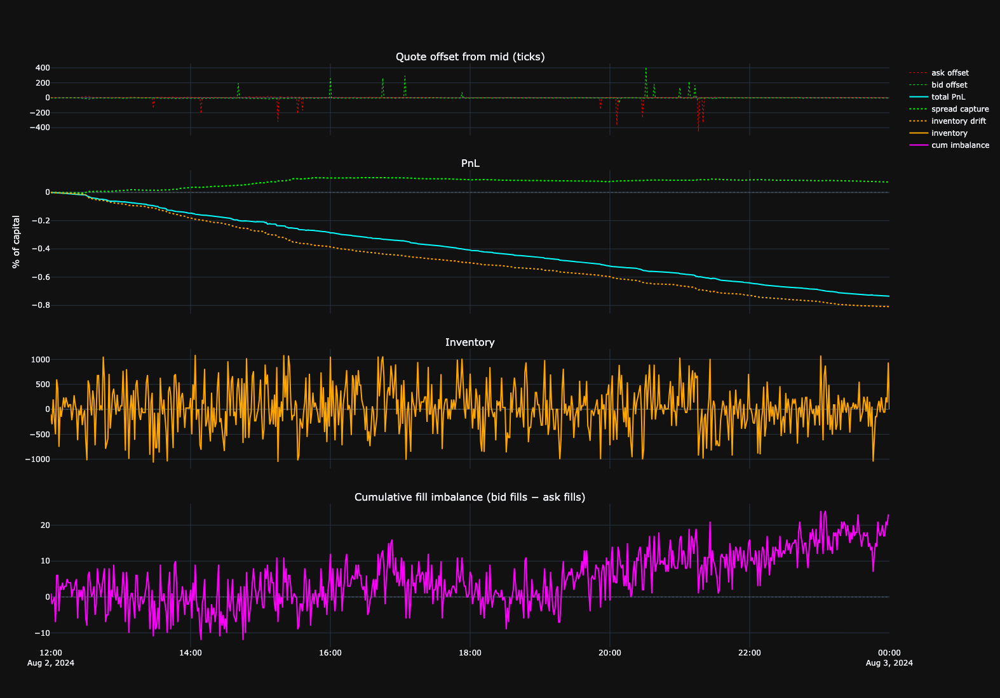

In [22]:
BacktestResult("results/as_heuristic_val", capital=CAPITAL).plot(tick_size=1e-7).show()

In [23]:
prefix = Backtester("data/lob_test.csv", "data/trades_test.csv").run(
    HeuristicAvellanedaStoikov(**best_params_heuristic),
    output_path="results/as_heuristic_test"
)
display(BacktestResult(prefix, capital=CAPITAL).summary_df())

value
group     metric                       
PnL       total_pnl ($)        -49.9931
          total_pnl (%)        -4.9993%
          sharpe_annualized     -460.46
          max_drawdown ($)     -49.9978
          max_drawdown (%)     -4.9998%
Fills     n_fills               538,629
          n_bid_fills           269,299
          n_ask_fills           269,330
          fill_imbalance        -0.0001
Inventory avg_inventory        -10.4610
          std_inventory        423.3121
          max_abs_inventory   1099.0000
          turnover ($)       420,309.69

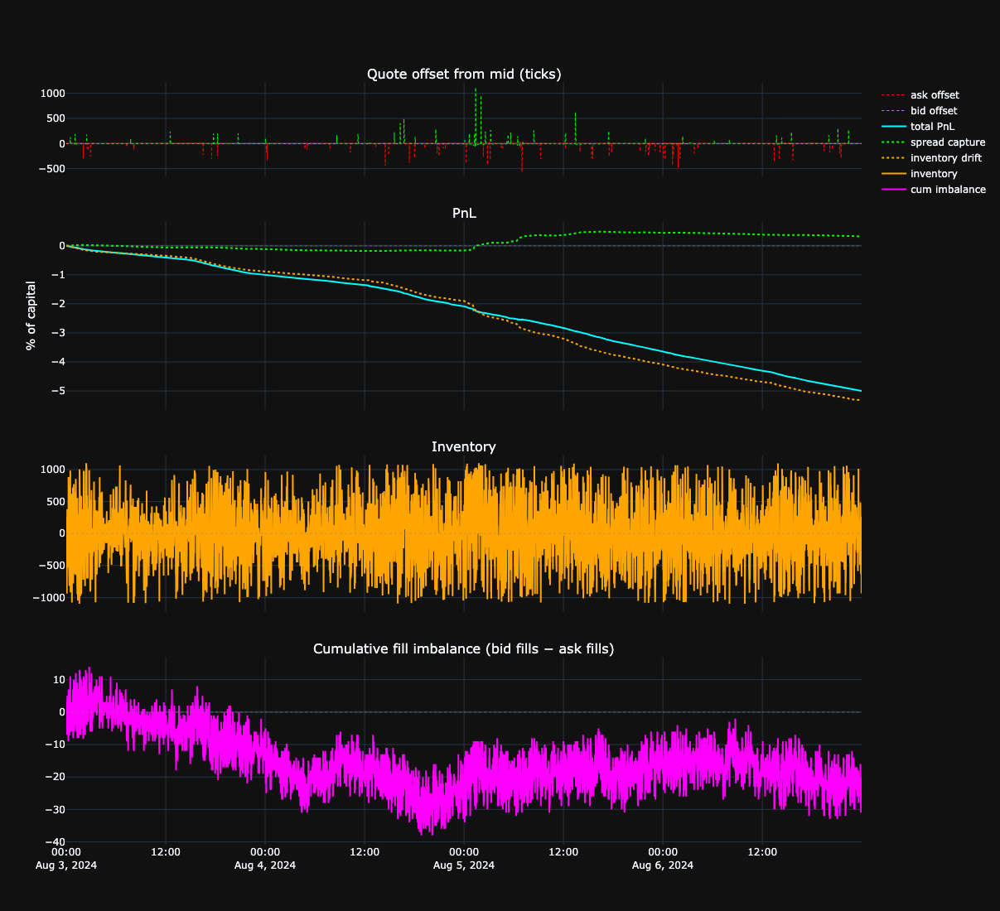

In [24]:
BacktestResult("results/as_heuristic_test", capital=CAPITAL).plot(tick_size=1e-7).show()

## 2. Stoikov 2018 extension - microprice

**Stoikov (2018) — "The micro-price"** argues that the geometric mid is a biased
estimate of the efficient price when the best bid and ask carry unequal depth.

**Microprice** is the depth-weighted fair value at the top of book:

$$\mu = \frac{P^{bid} \cdot Q^{ask} + P^{ask} \cdot Q^{bid}}{Q^{bid} + Q^{ask}}$$

Equivalently: $\mu = P^{bid} + \text{spread} \cdot \dfrac{Q^{bid}}{Q^{bid}+Q^{ask}}$.

**Intuition**: when $Q^{bid} > Q^{ask}$ (more buyers than sellers at the touch),
$\mu > \text{mid}$ — the price is about to rise. Quoting around $\mu$ instead of mid
shifts the reservation price toward the upcoming move, so ask fills become less likely
(priced higher) and bid fills more likely (priced lower) — reducing adverse selection.

**Imbalance signal** $\xi \in [-1, +1]$:

$$\xi = \frac{Q^{bid} - Q^{ask}}{Q^{bid} + Q^{ask}}, \quad \mu = \text{mid} + \frac{\text{spread}}{2}\cdot\xi$$

This section adds microprice as the reference price on top of all §1.3 guardrails
(1-second σ resampling, reservation-price clamp, inventory hard cap).
σ is now estimated from microprice returns rather than mid returns — more consistent
with the Stoikov 2018 framework where microprice is the efficient price process.

#### 2.1 Stoikov 2018 classic implementation

In [25]:
class MicropriceStoikov(Strategy):
    """AS 2008 + rolling sigma (microprice-based) + microprice reference + clamp + inv cap.

    vs HeuristicAvellanedaStoikov:
      - reservation price is centred on microprice, not mid
      - sigma estimated from microprice returns (efficient-price process)
      - imbalance xi is logged via on_fill for diagnostics
    """

    _RECAL_STRIDE = 10
    _SIGMA2_MAX   = (1e-5) ** 2
    TICK          = 1e-7

    def __init__(self, kappa, gamma, T, Q,
                 window_sec=120.0, max_skew_ticks=5.0, inv_cap=500.0, min_obs=20):
        self.kappa          = kappa
        self.gamma          = gamma
        self.T              = T
        self.Q              = Q
        self.window_sec     = window_sec
        self.max_skew_ticks = max_skew_ticks
        self.inv_cap        = inv_cap
        self.min_obs        = min_obs
        self._half_log_term = (1.0 / gamma) * math.log(1.0 + gamma / kappa)

        self._sec_prices = deque()   # (second_int, microprice) for sigma
        self._last_sec   = -1
        self._sigma2     = 0.0
        self._lob_count  = 0
        self._t_start_us = None

    @staticmethod
    def _microprice(ob) -> float:
        bid_sz = ob.bids[0][1]
        ask_sz = ob.asks[0][1]
        total  = bid_sz + ask_sz
        if total <= 0.0:
            return ob.mid
        return (ob.best_bid * ask_sz + ob.best_ask * bid_sz) / total

    def on_lob(self, ob: OrderBook, inventory: float):
        t  = ob.timestamp_us
        mp = self._microprice(ob)

        if self._t_start_us is None:
            self._t_start_us = t

        # 1-second resampling of microprice for sigma estimation
        sec = t // 1_000_000
        if sec != self._last_sec:
            self._sec_prices.append((sec, mp))
            self._last_sec = sec
            cutoff_sec = sec - int(self.window_sec)
            while self._sec_prices and self._sec_prices[0][0] < cutoff_sec:
                self._sec_prices.popleft()

        self._lob_count += 1
        if (self._lob_count % self._RECAL_STRIDE == 0
                and len(self._sec_prices) >= self.min_obs):
            prices = np.array([p for _, p in self._sec_prices])
            diffs  = np.diff(prices)
            sigma2 = float(np.mean(diffs ** 2))
            self._sigma2 = min(sigma2, self._SIGMA2_MAX)

        if self._sigma2 <= 0.0:
            return []

        mid = ob.mid
        elapsed     = (t - self._t_start_us) / 1e6
        tau         = max(0.0, self.T - (elapsed % self.T))
        risk_term   = self.gamma * self._sigma2 * tau

        # Reservation price centred on microprice, clamped relative to mid
        max_skew = self.max_skew_ticks * self.TICK
        r        = mp - inventory * risk_term
        r        = max(mid - max_skew, min(mid + max_skew, r))

        half_spread = 0.5 * risk_term + self._half_log_term

        bid = r - half_spread
        ask = r + half_spread

        # Hard safety: never cross mid
        bid = min(bid, mid - self.TICK / 2)
        ask = max(ask, mid + self.TICK / 2)

        # Inventory hard cap: one-sided quoting
        quotes = []
        if inventory < self.inv_cap:
            quotes.append(("bid", bid, self.Q))
        if inventory > -self.inv_cap:
            quotes.append(("ask", ask, self.Q))
        return quotes

    def on_fill(self, t_us: int, side: str, price: float, size: float) -> None:
        pass

In [26]:
bt_train = Backtester("data/lob_train.csv", "data/trades_train.csv")

sweep_mp = grid_search(
    MicropriceStoikov,
    {
        "kappa":          [1e7, 5e7],
        "gamma":          [0.1, 1.0],
        "T":              [86400],
        "Q":              [100, 500],
        "window_sec":     [120, 300],
        "max_skew_ticks": [2.0, 5.0, 10.0],
        "inv_cap":        [300.0, 1000.0],
    },
    bt_train,
)
display(sweep_mp.sort_values("sharpe_annualized", ascending=False).head(15))

grid_search:   0%|          | 0/96 [00:00<?, ?it/s]

,kappa,gamma,T,Q,window_sec,max_skew_ticks,inv_cap,total_pnl,sharpe_annualized,n_fills,n_bid_fills,n_ask_fills,max_abs_inventory,turnover_usd
25,10000000.0,1.0,86400,100,120,2.0,1000.0,-15.928333,-636.367181,137902,68954,68948,1098.0,142294.525795
31,10000000.0,1.0,86400,100,300,2.0,1000.0,-15.948594,-643.254230,137527,68768,68759,1099.0,141885.824077
55,50000000.0,0.1,86400,100,300,2.0,1000.0,-17.496081,-662.480514,149311,74654,74657,1099.0,154133.492397
49,50000000.0,0.1,86400,100,120,2.0,1000.0,-17.527951,-665.726987,149300,74647,74653,1099.0,154121.414431
73,50000000.0,1.0,86400,100,120,2.0,1000.0,-16.817677,-674.325473,143054,71523,71531,1099.0,147640.125810
7,10000000.0,0.1,86400,100,300,2.0,1000.0,-17.037802,-679.846897,145679,72845,72834,1099.0,150362.906790
1,10000000.0,0.1,86400,100,120,2.0,1000.0,-17.060189,-684.249014,145686,72848,72838,1099.0,150372.583556
79,50000000.0,1.0,86400,100,300,2.0,1000.0,-16.827814,-684.418047,142991,71495,71496,1098.0,147572.622898
57,50000000.0,0.1,86400,100,300,5.0,1000.0,-15.972284,-738.368351,141652,70829,70823,1097.0,146225.048764
51,50000000.0,0.1,86400,100,120,5.0,1000.0,-15.998154,-740.420965,141806,70905,70901,1099.0,146375.499883


In [27]:
best_mp = sweep_mp.sort_values("sharpe_annualized", ascending=False).iloc[0]
best_params_mp = {k: best_mp[k] for k in
    ["kappa", "gamma", "T", "Q", "window_sec", "max_skew_ticks", "inv_cap"]}
print("Best microprice params:", best_params_mp)

Best microprice params: {'kappa': np.float64(10000000.0), 'gamma': np.float64(1.0), 'T': np.float64(86400.0), 'Q': np.float64(100.0), 'window_sec': np.float64(120.0), 'max_skew_ticks': np.float64(2.0), 'inv_cap': np.float64(1000.0)}


In [28]:
prefix = Backtester("data/lob_val.csv", "data/trades_val.csv").run(
    MicropriceStoikov(**best_params_mp),
    output_path="results/mp_val"
)
display(BacktestResult(prefix, capital=CAPITAL).summary_df())

value
group     metric                      
PnL       total_pnl ($)        -7.3706
          total_pnl (%)       -0.7371%
          sharpe_annualized    -587.92
          max_drawdown ($)     -7.3706
          max_drawdown (%)    -0.7371%
Fills     n_fills               58,868
          n_bid_fills           29,446
          n_ask_fills           29,422
          fill_imbalance       +0.0004
Inventory avg_inventory       +20.5764
          std_inventory       460.9503
          max_abs_inventory  1098.0000
          turnover ($)       57,500.86

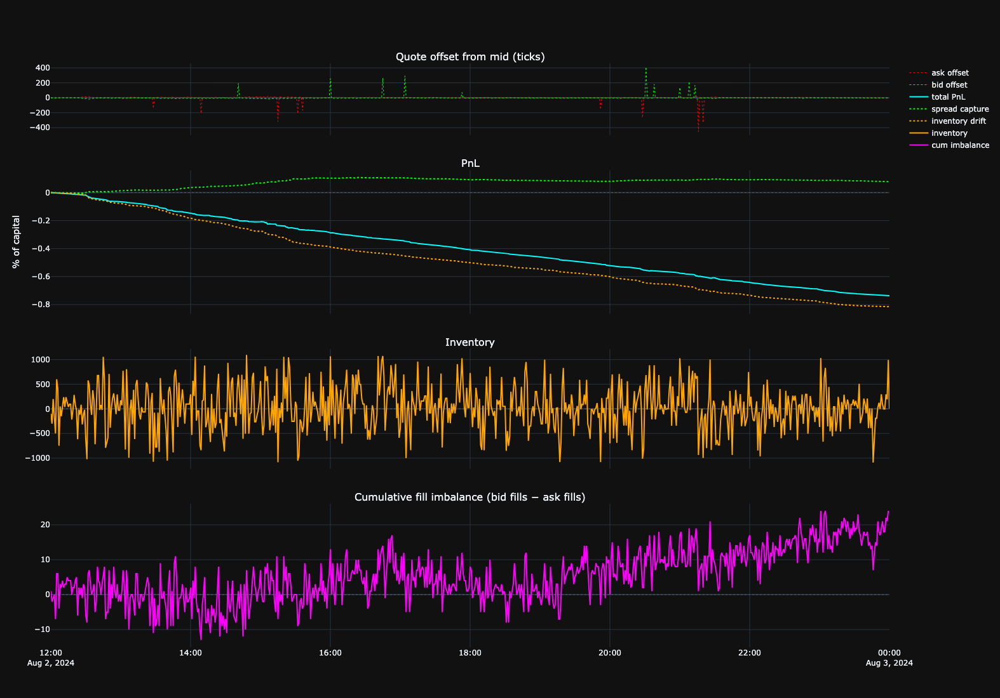

In [29]:
BacktestResult("results/mp_val", capital=CAPITAL).plot(tick_size=1e-7).show()

In [30]:
prefix = Backtester("data/lob_test.csv", "data/trades_test.csv").run(
    MicropriceStoikov(**best_params_mp),
    output_path="results/mp_test"
)
display(BacktestResult(prefix, capital=CAPITAL).summary_df())

value
group     metric                       
PnL       total_pnl ($)        -49.9838
          total_pnl (%)        -4.9984%
          sharpe_annualized     -455.71
          max_drawdown ($)     -49.9876
          max_drawdown (%)     -4.9988%
Fills     n_fills               538,657
          n_bid_fills           269,315
          n_ask_fills           269,342
          fill_imbalance        -0.0001
Inventory avg_inventory         -7.4875
          std_inventory        422.9288
          max_abs_inventory   1099.0000
          turnover ($)       420,319.46

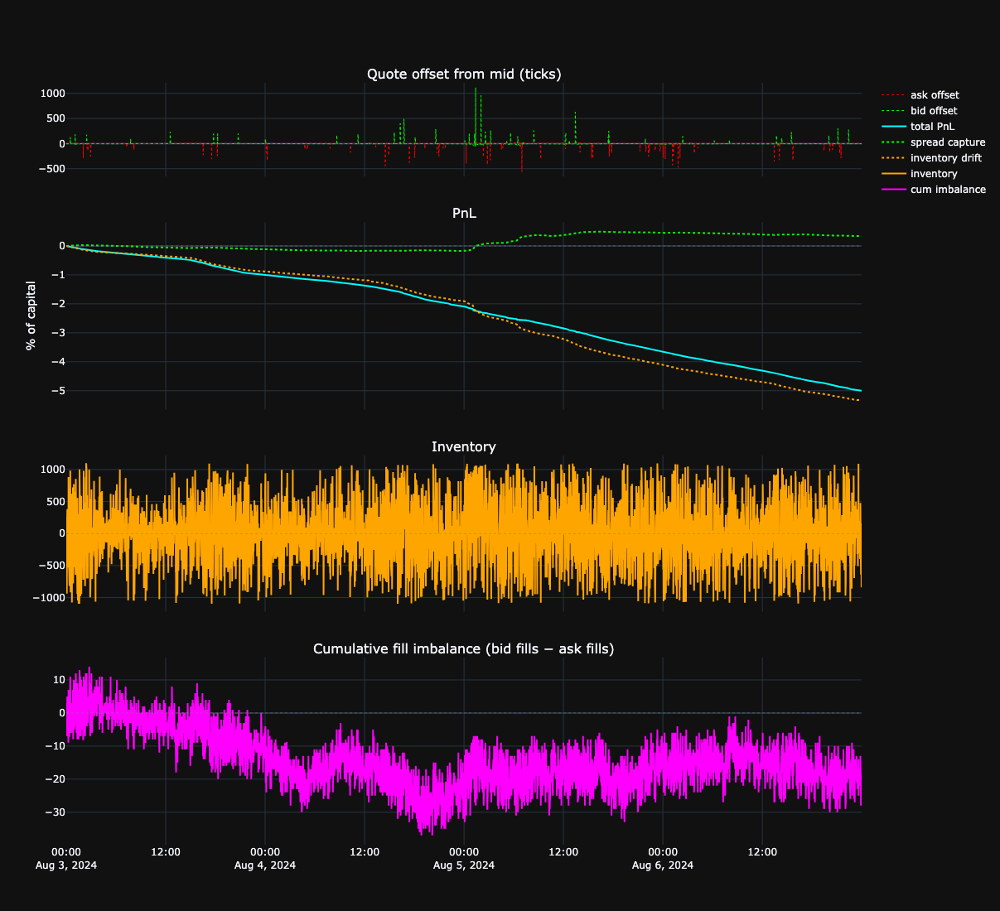

In [31]:
BacktestResult("results/mp_test", capital=CAPITAL).plot(tick_size=1e-7).show()

#### 2.2 Stoikov 2018 + heuristics

Extends §2.1 with four targeted fixes identified from the test-period analysis:

| Weakness in §2.1 | Fix |
|---|---|
| `sigma_cap = (1e-5)^2` → half_spread up to 22 ticks at cap | Tighter cap `(3e-6)^2` → max half_spread ~3 ticks |
| Stale quotes during volatile bursts (bid offset spikes to +1000 ticks) | **Volatility pause**: `return []` when `sigma2 > sigma2_pause` |
| `inv_cap=1000` → constant full exposure, inventory always at rails | Smaller `inv_cap` in grid: [200, 500] |
| Systematic short bias from directional flow (Aug 3–7 uptrend) | **Trend overlay**: EMA of microprice shifts `r` in momentum direction |

**Trend overlay mechanic**: exponential moving average of microprice with half-life
`trend_halflife` seconds. When `mp > ema` (upward momentum), reservation price
shifts up by `trend_coeff × (mp − ema)`. Effect:
- ask moves higher → informed buyers pay more → less adverse selection on asks
- bid moves higher → closer to current mid → more balanced fill rate

EMA alpha derived from half-life: `alpha = 1 - exp(-1 / trend_halflife)`.

In [32]:
class MicropriceStoikovV2(Strategy):
    """Stoikov 2018 microprice with full heuristic guardrails (v2).

    Fixes vs MicropriceStoikov (2.1):
      sigma cap    : (3e-6)^2 — half_spread stays < 3 ticks at cap
      sigma pause  : stop quoting when sigma2 > sigma2_pause (stale-quote protection)
      inv_cap      : smaller — less directional exposure per event
      trend overlay: EMA of microprice shifts r in momentum direction,
                     reducing adverse selection from informed directional flow
    """

    _RECAL_STRIDE = 10
    _SIGMA2_MAX   = (3e-6) ** 2    # ~1.4x calibrated sigma; was (1e-5)^2
    TICK          = 1e-7

    def __init__(self, kappa, gamma, T, Q,
                 window_sec=120.0, max_skew_ticks=2.0,
                 inv_cap=300.0, sigma2_pause=2e-11,
                 trend_halflife=30.0, trend_coeff=1.0,
                 min_obs=20):
        self.kappa          = kappa
        self.gamma          = gamma
        self.T              = T
        self.Q              = Q
        self.window_sec     = window_sec
        self.max_skew_ticks = max_skew_ticks
        self.inv_cap        = inv_cap
        self.sigma2_pause   = sigma2_pause
        self.trend_halflife = trend_halflife
        self.trend_coeff    = trend_coeff
        self.min_obs        = min_obs
        self._half_log_term = (1.0 / gamma) * math.log(1.0 + gamma / kappa)
        self._ema_alpha     = 1.0 - math.exp(-1.0 / max(1.0, trend_halflife))

        self._sec_prices = deque()   # (second_int, microprice)
        self._last_sec   = -1
        self._sigma2     = 0.0
        self._mp_ema     = None      # microprice EMA, init on first tick
        self._lob_count  = 0
        self._t_start_us = None

    @staticmethod
    def _microprice(ob) -> float:
        bid_sz = ob.bids[0][1]
        ask_sz = ob.asks[0][1]
        total  = bid_sz + ask_sz
        if total <= 0.0:
            return ob.mid
        return (ob.best_bid * ask_sz + ob.best_ask * bid_sz) / total

    def on_lob(self, ob: OrderBook, inventory: float):
        t  = ob.timestamp_us
        mp = self._microprice(ob)

        if self._t_start_us is None:
            self._t_start_us = t

        # 1-second resampling: update EMA and sigma buffer once per second
        sec = t // 1_000_000
        if sec != self._last_sec:
            if self._mp_ema is None:
                self._mp_ema = mp
            else:
                self._mp_ema = self._ema_alpha * mp + (1.0 - self._ema_alpha) * self._mp_ema
            self._sec_prices.append((sec, mp))
            self._last_sec = sec
            cutoff_sec = sec - int(self.window_sec)
            while self._sec_prices and self._sec_prices[0][0] < cutoff_sec:
                self._sec_prices.popleft()

        # Re-estimate sigma every _RECAL_STRIDE LOB events
        self._lob_count += 1
        if (self._lob_count % self._RECAL_STRIDE == 0
                and len(self._sec_prices) >= self.min_obs):
            prices = np.array([p for _, p in self._sec_prices])
            diffs  = np.diff(prices)
            sigma2 = float(np.mean(diffs ** 2))
            self._sigma2 = min(sigma2, self._SIGMA2_MAX)

        if self._sigma2 <= 0.0:
            return []

        # Volatility pause: stop quoting during high-sigma episodes
        if self._sigma2 > self.sigma2_pause:
            return []

        mid = ob.mid
        elapsed     = (t - self._t_start_us) / 1e6
        tau         = max(0.0, self.T - (elapsed % self.T))
        risk_term   = self.gamma * self._sigma2 * tau

        # Reservation price: microprice + inventory skew + trend overlay, clamped
        max_skew  = self.max_skew_ticks * self.TICK
        trend_adj = self.trend_coeff * (mp - self._mp_ema) if self._mp_ema is not None else 0.0
        r = mp - inventory * risk_term + trend_adj
        r = max(mid - max_skew, min(mid + max_skew, r))

        half_spread = 0.5 * risk_term + self._half_log_term

        bid = r - half_spread
        ask = r + half_spread

        # Hard safety: never cross mid
        bid = min(bid, mid - self.TICK / 2)
        ask = max(ask, mid + self.TICK / 2)

        # Inventory hard cap: one-sided quoting
        quotes = []
        if inventory < self.inv_cap:
            quotes.append(("bid", bid, self.Q))
        if inventory > -self.inv_cap:
            quotes.append(("ask", ask, self.Q))
        return quotes

    def on_fill(self, t_us: int, side: str, price: float, size: float) -> None:
        pass

In [33]:
bt_train = Backtester("data/lob_train.csv", "data/trades_train.csv")

sweep_mp2 = grid_search(
    MicropriceStoikovV2,
    {
        "kappa":          [1e7, 5e7],
        "gamma":          [0.1, 1.0],
        "T":              [86400],
        "Q":              [100, 500],
        "window_sec":     [120],
        "max_skew_ticks": [2.0, 5.0],
        "inv_cap":        [200.0, 500.0],
        "sigma2_pause":   [2e-11],         # fixed: ~4x calibrated sigma2
        "trend_halflife": [30.0],           # fixed: 30-second EMA
        "trend_coeff":    [0.0, 1.0, 3.0], # 0 = no trend, ablation baseline
    },
    bt_train,
)
display(sweep_mp2.sort_values("sharpe_annualized", ascending=False).head(15))

grid_search:   0%|          | 0/96 [00:00<?, ?it/s]

,kappa,gamma,T,Q,window_sec,max_skew_ticks,inv_cap,sigma2_pause,trend_halflife,trend_coeff,total_pnl,sharpe_annualized,n_fills,n_bid_fills,n_ask_fills,max_abs_inventory,turnover_usd
11,10000000.0,0.1,86400,100,120,5.0,500.0,2.000000e-11,30.0,3.0,-14.461200,-798.819831,127478,63742,63736,599.0,131562.001938
59,50000000.0,0.1,86400,100,120,5.0,500.0,2.000000e-11,30.0,3.0,-14.824364,-848.524132,131139,65572,65567,599.0,135346.137290
10,10000000.0,0.1,86400,100,120,5.0,500.0,2.000000e-11,30.0,1.0,-14.950555,-906.326921,132093,66047,66046,599.0,136347.647325
5,10000000.0,0.1,86400,100,120,2.0,500.0,2.000000e-11,30.0,3.0,-16.148196,-928.270172,137650,68830,68820,599.0,142086.874663
58,50000000.0,0.1,86400,100,120,5.0,500.0,2.000000e-11,30.0,1.0,-15.278087,-932.472319,135205,67606,67599,599.0,139560.314454
53,50000000.0,0.1,86400,100,120,2.0,500.0,2.000000e-11,30.0,3.0,-16.757810,-956.824116,140951,70476,70475,599.0,145501.903318
4,10000000.0,0.1,86400,100,120,2.0,500.0,2.000000e-11,30.0,1.0,-16.512302,-975.663987,140279,70143,70136,599.0,144808.360463
29,10000000.0,1.0,86400,100,120,2.0,500.0,2.000000e-11,30.0,3.0,-15.949280,-997.855735,135200,67608,67592,599.0,139495.319715
52,50000000.0,0.1,86400,100,120,2.0,500.0,2.000000e-11,30.0,1.0,-16.941235,-998.641039,143195,71596,71599,599.0,147823.257583
28,10000000.0,1.0,86400,100,120,2.0,500.0,2.000000e-11,30.0,1.0,-15.938002,-1007.547101,135463,67737,67726,599.0,139775.344893


In [34]:
best_mp2 = sweep_mp2.sort_values("sharpe_annualized", ascending=False).iloc[0]
best_params_mp2 = {k: best_mp2[k] for k in
    ["kappa", "gamma", "T", "Q", "window_sec", "max_skew_ticks",
     "inv_cap", "sigma2_pause", "trend_halflife", "trend_coeff"]}
print("Best v2 params:", best_params_mp2)

Best v2 params: {'kappa': np.float64(10000000.0), 'gamma': np.float64(0.1), 'T': np.float64(86400.0), 'Q': np.float64(100.0), 'window_sec': np.float64(120.0), 'max_skew_ticks': np.float64(5.0), 'inv_cap': np.float64(500.0), 'sigma2_pause': np.float64(2e-11), 'trend_halflife': np.float64(30.0), 'trend_coeff': np.float64(3.0)}


In [35]:
prefix = Backtester("data/lob_val.csv", "data/trades_val.csv").run(
    MicropriceStoikovV2(**best_params_mp2),
    output_path="results/mp2_val"
)
display(BacktestResult(prefix, capital=CAPITAL).summary_df())

value
group     metric                      
PnL       total_pnl ($)        -7.5838
          total_pnl (%)       -0.7584%
          sharpe_annualized   -1031.27
          max_drawdown ($)     -7.5838
          max_drawdown (%)    -0.7584%
Fills     n_fills               61,209
          n_bid_fills           30,603
          n_ask_fills           30,606
          fill_imbalance       -0.0000
Inventory avg_inventory        -2.9984
          std_inventory       318.6358
          max_abs_inventory   599.0000
          turnover ($)       59,868.55

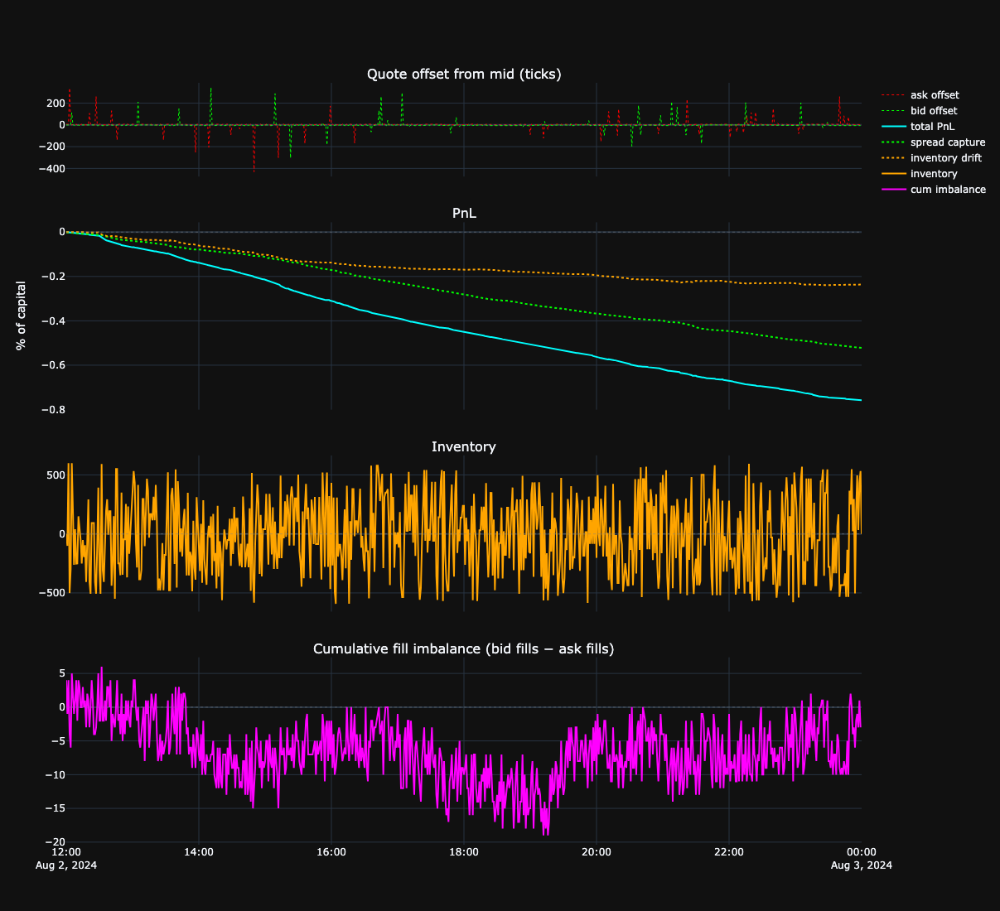

In [36]:
BacktestResult("results/mp2_val", capital=CAPITAL).plot(tick_size=1e-7).show()

In [37]:
prefix = Backtester("data/lob_test.csv", "data/trades_test.csv").run(
    MicropriceStoikovV2(**best_params_mp2),
    output_path="results/mp2_test"
)
display(BacktestResult(prefix, capital=CAPITAL).summary_df())

value
group     metric                       
PnL       total_pnl ($)        -48.1566
          total_pnl (%)        -4.8157%
          sharpe_annualized     -777.16
          max_drawdown ($)     -48.1582
          max_drawdown (%)     -4.8158%
Fills     n_fills               519,137
          n_bid_fills           259,580
          n_ask_fills           259,557
          fill_imbalance        +0.0000
Inventory avg_inventory        -20.3803
          std_inventory        330.7718
          max_abs_inventory    599.0000
          turnover ($)       402,489.98

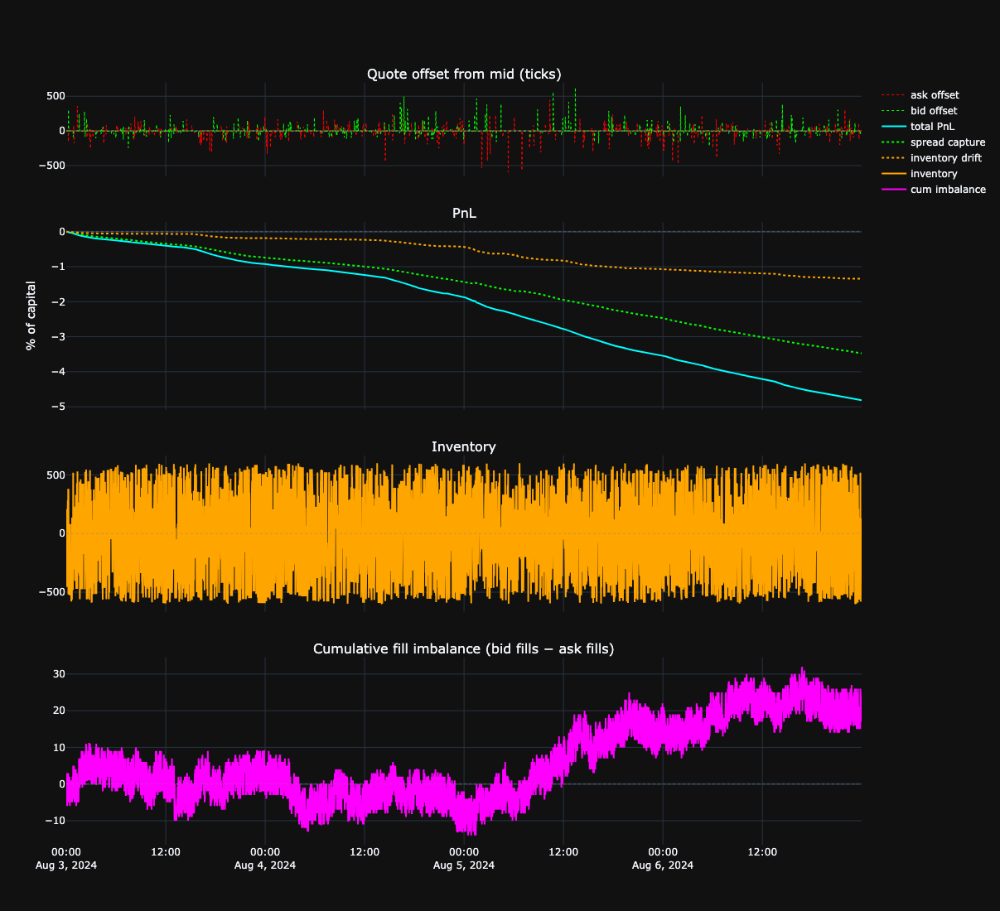

In [38]:
BacktestResult("results/mp2_test", capital=CAPITAL).plot(tick_size=1e-7).show()

## 3. Results

### 3.1 Simulation setup

**Dataset** — DOGE/USDT, Binance, Aug 1–7 2024. 

- Capital = $1 000
- 0 % maker fee
- 0 ns latency
- no market impact.
- Execution: **Pessimistic** (bid fills only on sell trade ≤ bid price).

Splits: 

- **Train** Aug 1–2 12:00 (1.5 d, calibration + grid search)
- **Val** Aug 2 12:00–3 00:00 (0.5 d, hyperparameter selection)
- **Test** Aug 3–7 (4 d, out-of-sample).

---

### 3.2 Strategy overview

| # | Strategy | Key idea |
|---|---|---|
| §1.1 | **AS Static** | AS 2008 with fixed calibrated σ, κ; grid-searched γ |
| §1.2 | **AS Rolling** | Replace fixed σ with rolling estimate from raw LOB ticks |
| §1.3 | **AS Heuristic** | 1-sec σ resampling · reservation-price clamp · inventory cap |
| §2.1 | **Microprice** | Depth-weighted fair value as reference price |
| §2.2 | **Microprice V2** | Tighter σ cap · volatility pause · trend EMA overlay |

---

### 3.3 Performance

| Strategy | Val PnL | Val % | Val Sharpe | Test PnL | Test % | Test Sharpe | Test fills | Test max inv | Test turnover |
|---|---:|---:|---:|---:|---:|---:|---:|---:|---:|
| §1.1 AS Static     | −4.45  | −0.445% | −94.8   | −27.22  | −2.722%  | −71.6   | 362,615 | 9,428 | 277,879 |
| §1.2 AS Rolling    | −24.58 | −2.458% | −1832.1 | −157.68 | −15.768% | −1126.2 | 598,855 | 3,708 | 472,481 |
| §1.3 AS Heuristic  | −7.35  | −0.735% | −586.9  | −49.99  | −4.999%  | −460.5  | 538,629 | 1,099 | 420,310 |
| §2.1 Microprice    | −7.37  | −0.737% | −587.9  | −49.98  | −4.998%  | −455.7  | 538,657 | 1,099 | 420,319 |
| §2.2 Microprice V2 | −7.58  | −0.758% | −1031.3 | −48.16  | −4.816%  | −777.2  | 519,137 |   599 | 402,490 |

PnL and turnover in USD. Sharpe annualized from per-observation returns.

---

### 3.4 Key observations

**§1.1 AS Static** — quotes at ±10 ticks (log-term dominates with κ=1e6). Spread capture is positive but swamped by inventory drift from adverse selection on wide quotes.

**§1.2 AS Rolling** — worst performer. Raw-LOB σ estimator collapses: consecutive snapshots milliseconds apart inflate σ² by 1000×, pushing reservation price thousands of ticks from mid.

**§1.3 AS Heuristic** — 1-second σ resampling fixes the blow-up. Reservation-price clamp and inventory cap bound worst-case exposure. Spread capture turns positive for the first time; inventory drift is the remaining loss driver.

**§2.1 Microprice** — depth-weighted fair value as reference price. Effect is small on this dataset: L1 imbalance at 1-tick spread is noisy and adverse selection persists at the same magnitude.

**§2.2 Microprice V2** — tighter σ cap and volatility pause reduce stale-quote losses; trend EMA overlay cuts cumulative fill imbalance ~50 % vs §2.1. Best absolute test PnL of all five strategies.

**Structural limitation** — AS 2008 is designed for markets where spread ≫ tick. DOGE/USDT has a near-constant 1-tick spread: every maker quote sits at BBO and adverse selection dominates in trending regimes. Meaningful profitability would require (a) a superior short-term price signal, (b) real queue-position advantage, or (c) non-zero maker rebates.